### Walmart Weekly Sales Prediction

### Goal of the project:

The goal of the project is to predict the weekly sales of Walmart challenge.

### The Problem and Metric Evaluation

The data is obtained from Walmart stores accross the US. Prediction of the weekly sales is a regression problem because cost depends on many factors like Store,  Holidays, Temperature,Fuel_Price, etc and the output is a continuous variable. Regression models investigate the relationship between the dependent variable (here it is sales) and independent variables. The metrics mean absolute error (MAE), mean squared error (MSE), and root mean squared error (RMSE) are used to evaluate the model performance of this problem.


### Summary
There are 282451 rows and 16 columns in the training data set.The type of the data set include integer, float, object and boolean. Except Markdown features, the data have no null values. The data does not have any duplicate values. There are 45 stores and 81 department in data. Departments are not same in all stores. The total weekly sales in the data are 282451. The minimum, average and maximum of weekly sales are -4,988.94, 15,983.43 and 693,099.36. Histogram and the distribution of weekly sales shows that the data is skewed to right.There are outliers present in the weekly sales after 250000 sales which is 0.03 %  (108 rows) of data out of 282451 records. The data was cleaned by  changing Time to datetime stamp, changing the variable "IsHoliday" from Boolean values to integer and filling the missing values (NaN) with zero. The analysis shows that the weeky sales are in its maximum during December and sales dropped in 2012 compared to 2010. But, November and December sales are not in the data for 2012. Weekly sales are more during the holidays compared to other days.There is no relationship of weeky slaes as the fuel price increases.There are 45 stores and 81 department in data. Departments are not same in all stores. Department 72 has higher weekly sales values. Stores has 3 types as A, B and C according to their sizes. Almost half of the stores are bigger than 150000 and categorized as A. According to type, sales of the stores are changing. CPI, temperature, unemployment rate and fuel price have no pattern on weekly sales. Linear regression was used as the baseline model. The cleaned data without any feature engineering was used for baseline modelling. Then outliers were removed and the features 'timestamp','CPI', 'dayofweek' were dropped during feature engineering. The other models used in this notebook are Linear regression, random forest and Light Gradient Boosting Machine. The most well performed model was random forest and it was used for the prediction of given test data.

**Structure of the notebook**

    1. Loading the Data and Packages
    2. Exploring the data
    3. Cleaning Data
    4. Analyzing the Variables
    5. Baseline Model
    6. Feature Engineering
    7. Feature Selection
    8. Modelling
    9. Model Selection 
    10. The prediction on test data
    11. Outlook

#### 1. Loading the Data and Packages

In [1]:
# pip install -U kaleido

import pandas as pd # data handling
import numpy as np
from scipy.stats import skew
from scipy import stats
from scipy.stats import norm

# Plot
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from matplotlib.ticker import PercentFormatter
plt.rcParams.update({ "figure.figsize" : (8, 5),"axes.facecolor" : "white", "axes.edgecolor":  "black"})
plt.rcParams["figure.facecolor"]= "w"
pd.plotting.register_matplotlib_converters()
pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.options.display.float_format = "{:,.2f}".format

# Modelling
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error, mean_squared_error
from math import sqrt
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings('ignore')

In [2]:
df_train = pd.read_csv("data/train.csv", sep = ",")

#### 2. Exploring the data

    2.1. Checking for the column names
    2.2. Checking for how many rows and columns
    2.3. Checking for type of data present in the dataframe
    2.4. Checking for null values in each column
    2.5. Checking for unique values
    2.6. Finding the descriptive statistics
    2.7. Plotting histogram for float/integer features
    2.8. Correlation heat map
    2.9. Checking for outliers
    2.10. Checking for duplicates

In [3]:
df_train.head(2)

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Type,Size
0,26,92,2011-08-26,"87,235.57",False,61.10,3.80,NaN,NaN,NaN,NaN,NaN,136.21,7.77,A,152513
1,34,22,2011-03-25,"5,945.97",False,53.11,3.48,NaN,NaN,NaN,NaN,NaN,128.62,10.40,A,158114


In [4]:
df_train.tail(2)

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Type,Size
282449,15,90,2011-07-01,"5,013.89",False,67.43,3.92,NaN,NaN,NaN,NaN,NaN,135.45,7.81,B,123737
282450,13,32,2011-10-14,"8,103.12",False,51.74,3.57,NaN,NaN,NaN,NaN,NaN,129.77,6.39,A,219622


In [5]:
#Checking for the column names
df_train.columns

Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday', 'Temperature',
       'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4',
       'MarkDown5', 'CPI', 'Unemployment', 'Type', 'Size'],
      dtype='object')

In [6]:
#Checking for how many rows and columns
df_train.shape

(282451, 16)

There are 282451 rows and 16 columns in the training data set.

In [7]:
# Checking for type of data present in the dataframe
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 282451 entries, 0 to 282450
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Store         282451 non-null  int64  
 1   Dept          282451 non-null  int64  
 2   Date          282451 non-null  object 
 3   Weekly_Sales  282451 non-null  float64
 4   IsHoliday     282451 non-null  bool   
 5   Temperature   282451 non-null  float64
 6   Fuel_Price    282451 non-null  float64
 7   MarkDown1     100520 non-null  float64
 8   MarkDown2     74232 non-null   float64
 9   MarkDown3     91521 non-null   float64
 10  MarkDown4     90031 non-null   float64
 11  MarkDown5     101029 non-null  float64
 12  CPI           282451 non-null  float64
 13  Unemployment  282451 non-null  float64
 14  Type          282451 non-null  object 
 15  Size          282451 non-null  int64  
dtypes: bool(1), float64(10), int64(3), object(2)
memory usage: 32.6+ MB


The type of the data set include integer, float, object and boolean.

In [8]:
#Checking the column types
#df_train.dtypes

In [9]:
#Checking for null values in each column
df_train.isnull().sum()

Store                0
Dept                 0
Date                 0
Weekly_Sales         0
IsHoliday            0
Temperature          0
Fuel_Price           0
MarkDown1       181931
MarkDown2       208219
MarkDown3       190930
MarkDown4       192420
MarkDown5       181422
CPI                  0
Unemployment         0
Type                 0
Size                 0
dtype: int64

Except Markdown features, the data have no null values. 

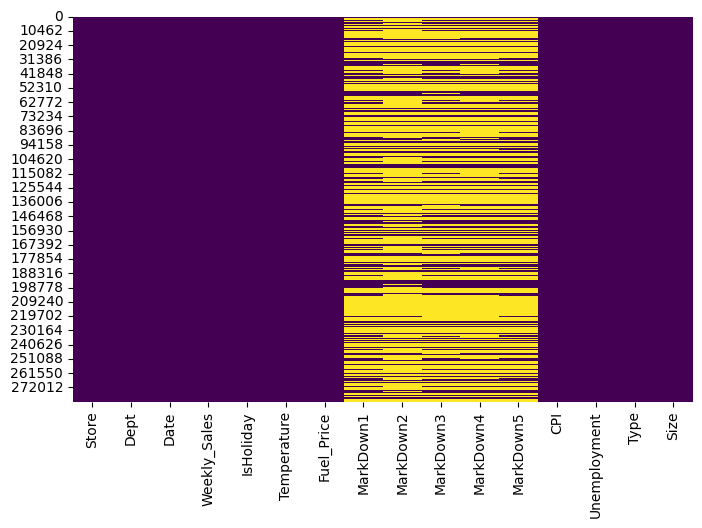

In [10]:
sns.heatmap(df_train.isnull(),cbar=False,cmap='viridis');

In [11]:
# Checking for unique values
df_train.nunique()

Store               45
Dept                81
Date               143
Weekly_Sales    248045
IsHoliday            2
Temperature       3528
Fuel_Price         892
MarkDown1         2277
MarkDown2         1499
MarkDown3         1662
MarkDown4         1944
MarkDown5         2293
CPI               2145
Unemployment       349
Type                 3
Size                40
dtype: int64

In [12]:
# Finding the descriptive statistics
df_train.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Store,"282,451.00",22.19,12.78,1.00,11.00,22.00,33.00,45.00
Dept,"282,451.00",44.29,30.50,1.00,18.00,38.00,74.00,99.00
Weekly_Sales,"282,451.00","15,983.43","22,661.09","-4,988.94","2,079.33","7,616.55","20,245.75","693,099.36"
Temperature,"282,451.00",60.11,18.45,-2.06,46.78,62.15,74.29,100.14
Fuel_Price,"282,451.00",3.36,0.46,2.47,2.93,3.45,3.74,4.47
MarkDown1,"100,520.00","7,246.08","8,254.61",0.27,"2,241.19","5,363.52","9,235.59","88,646.76"
MarkDown2,"74,232.00","3,318.41","9,485.58",-265.76,40.96,191.82,"1,919.79","104,519.54"
MarkDown3,"91,521.00","1,417.40","9,547.86",-29.10,5.06,24.34,103.13,"141,630.61"
MarkDown4,"90,031.00","3,379.59","6,269.43",0.22,508.10,"1,482.03","3,607.57","67,474.85"
MarkDown5,"101,029.00","4,639.48","6,060.46",135.16,"1,877.81","3,364.41","5,563.80","108,519.28"


The total weekly sales in the data are 282451. The minimum, average and maximum of weekly sales are -4,988.94, 15,983.43 and 693,099.36.

In [13]:
# Description of the boolean value
bool_features=df_train[['IsHoliday']]
bool_features.describe()

,IsHoliday
count,282451
unique,2
top,False
freq,262632


In [14]:
# plt.figure(figsize=[24,20])
# sns.heatmap(df_train.corr(), annot=True, vmin=-1, vmax=1, center=0) #cmap='BuGn'
# plt.show()

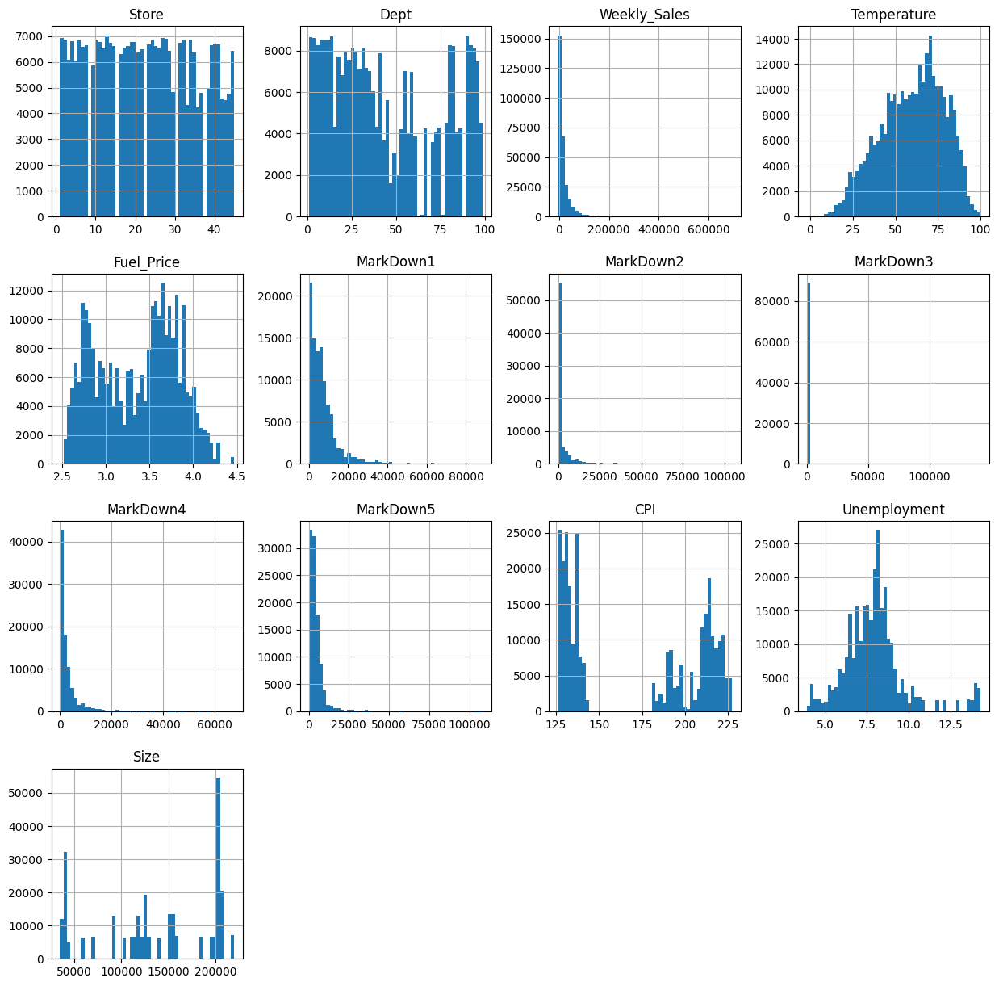

In [15]:
# Plotting histogram for float/integer features 
df_train.hist(bins=50, figsize=(15,15))
plt.savefig('Images/1.png');

Checking for Outliers

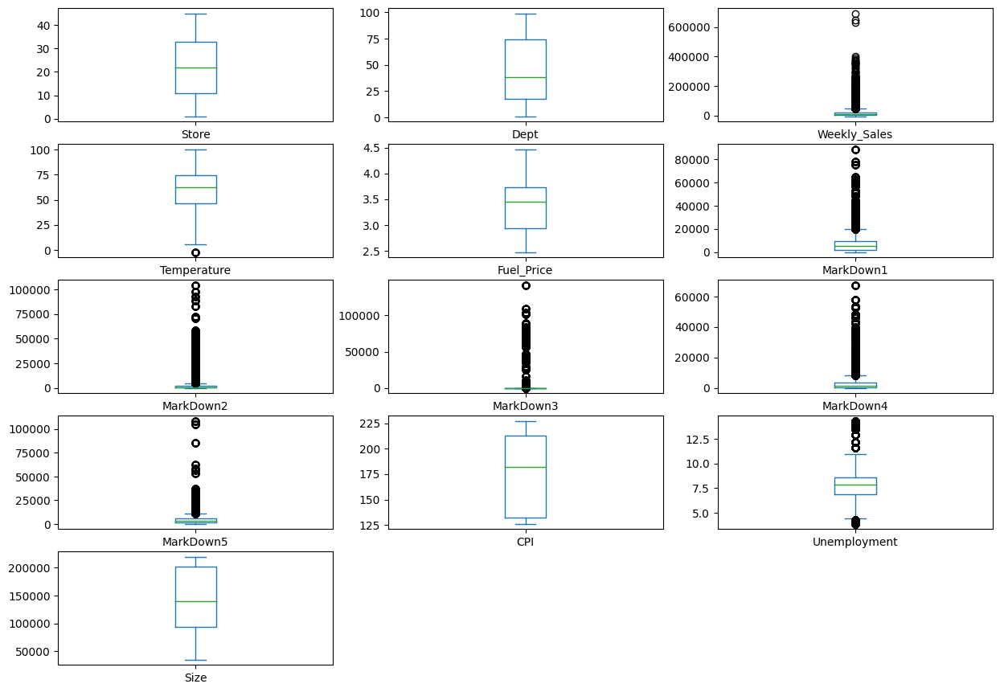

In [16]:
df_train.plot(kind='box', subplots=True, layout=(7,3), figsize=(15,15)) #
plt.savefig('Images/2.png');

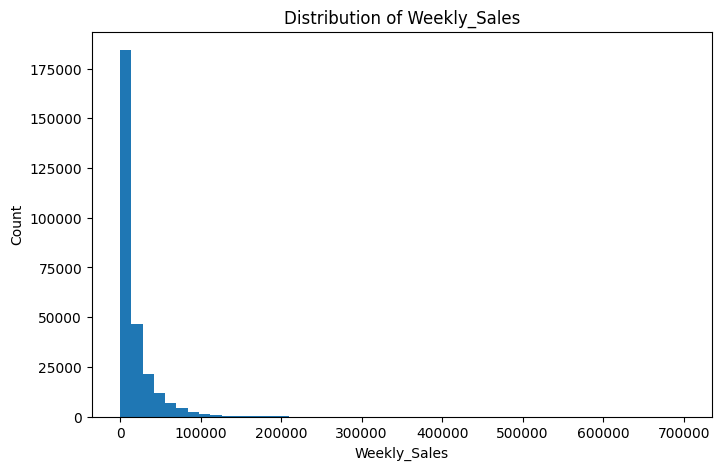

In [17]:
#Drawing weekly sales histogram 
plt.hist(df_train.Weekly_Sales, bins= 50, range = [0,700000])
plt.title("Distribution of Weekly_Sales")
plt.xlabel("Weekly_Sales")
plt.ylabel("Count")
plt.savefig('Images/3.png');

Histogram and the distribution of weekly sales shows that the data is skewed to right.

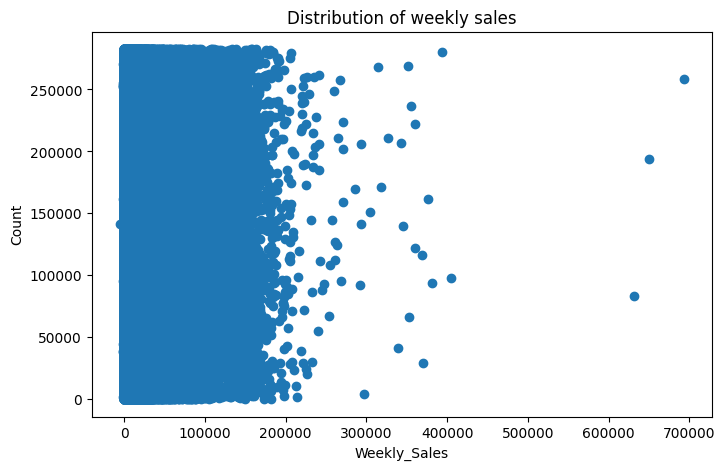

In [18]:
#Draw a scatter plot
plt.scatter(df_train.Weekly_Sales.values, range(df_train.shape[0]))
plt.title("Distribution of weekly sales")
plt.xlabel("Weekly_Sales")
plt.ylabel("Count")
plt.savefig('Images/4.png');

<AxesSubplot:xlabel='Fuel_Price', ylabel='Weekly_Sales'>

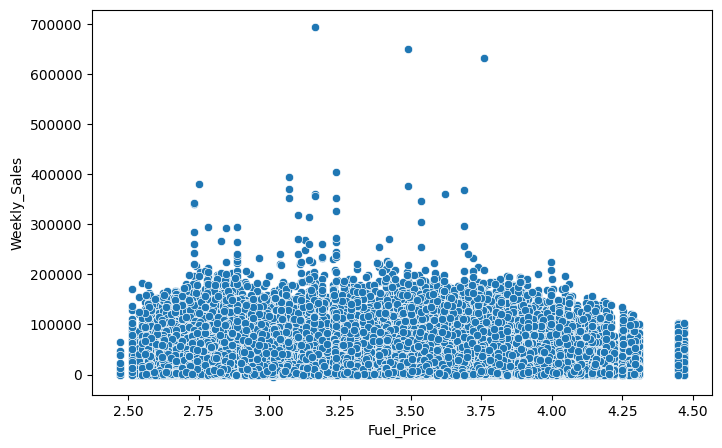

In [20]:
# Correlation between Weekly sales and Fuel price
sns.scatterplot(x='Fuel_Price', y='Weekly_Sales', data=df_train)

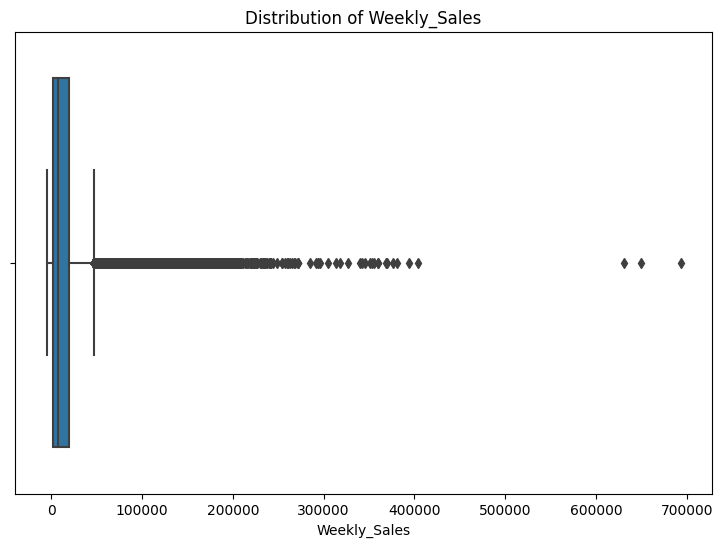

In [21]:
fig, ax = plt.subplots(figsize=(9, 6))
sns.boxplot(x='Weekly_Sales', data=df_train, ax=ax)
ax.set(title='Distribution of Weekly_Sales', xlabel='Weekly_Sales')
plt.savefig('Images/5.png');

There are outliers present in the weekly sales after 250000 sales.

In [22]:
# Checking the count of outliers
df_train.loc[df_train['Weekly_Sales'] > 250000].value_counts().count()

16

In [23]:
# # Checking the count of outliers
df_outliers = df_train.loc[df_train['Weekly_Sales'] > 250000]
df_outliers.shape

(39, 16)

There are 0.03 %  (108 rows) of data out of 282451 records are outliers.
(108/282451 * 100 = 0.03%) 

In [24]:
df_train.loc[df_train['Weekly_Sales'] >250000,"Date"].value_counts()

2011-11-25    14
2010-11-26    12
2010-12-24     7
2011-12-23     4
2010-12-17     1
2010-02-05     1
Name: Date, dtype: int64

In [25]:
#Checking skewness
df_train.skew()

Store           0.08
Dept            0.36
Weekly_Sales    3.24
IsHoliday       3.37
Temperature    -0.33
Fuel_Price     -0.10
MarkDown1       3.32
MarkDown2       5.50
MarkDown3       8.48
MarkDown4       4.86
MarkDown5       8.43
CPI             0.08
Unemployment    1.19
Size           -0.33
dtype: float64

In [26]:
#Checking for duplicates
def check_duplicates(data):
    has_dup = data.duplicated()
    true_dup = np.where(has_dup == True)
    if len(true_dup[0]) > 0:
        print("Data has", len(true_dup[0]), "duplicates")
    else:
        print("No duplicates found !!!")

check_duplicates(df_train)

No duplicates found !!!


### 3. Cleaning the data

    3. 1. Changing Time to datetime stamp 
    3. 2. Changing the variable "IsHoliday" from Boolean values to integer
    3. 3. Filling the missing values (NaN) with zero

In [27]:
#Changing Time to datetime stamp
df_train['Date'] = pd.to_datetime(df_train['Date'], format='%Y-%m-%d')

In [28]:
#Extracting year, month, and day from the date column
df_train = df_train.assign(
    timestamp = lambda x: pd.to_datetime(x['Date']), 
    year = lambda x: x['timestamp'].dt.year,
    month = lambda x: x['timestamp'].dt.month,
    day = lambda x: x['timestamp'].dt.day,
    dayofweek = lambda x: x['Date'].dt.dayofweek
)

In [29]:
#Changing the variable "IsHoliday" from Boolean values to integer
df_train["IsHoliday"] = df_train["IsHoliday"].astype(int)

In [30]:
#Changing NaN values to zero
df_train.fillna(0, inplace=True)

In [31]:
df_train.head(2)

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,...,MarkDown5,CPI,Unemployment,Type,Size,timestamp,year,month,day,dayofweek
0,26,92,2011-08-26,"87,235.57",0,61.10,3.80,0.00,0.00,0.00,...,0.00,136.21,7.77,A,152513,2011-08-26,2011,8,26,4
1,34,22,2011-03-25,"5,945.97",0,53.11,3.48,0.00,0.00,0.00,...,0.00,128.62,10.40,A,158114,2011-03-25,2011,3,25,4


### 4. Analysing the data

4.1. Weekly_Sales

In [32]:
# statistical analysis like percentile, mean, std dev
df_train.Weekly_Sales.describe()

count   282,451.00
mean     15,983.43
std      22,661.09
min      -4,988.94
25%       2,079.33
50%       7,616.55
75%      20,245.75
max     693,099.36
Name: Weekly_Sales, dtype: float64

Weekly Sales in Year

In [33]:
df_train.columns

Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday', 'Temperature',
       'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4',
       'MarkDown5', 'CPI', 'Unemployment', 'Type', 'Size', 'timestamp', 'year',
       'month', 'day', 'dayofweek'],
      dtype='object')

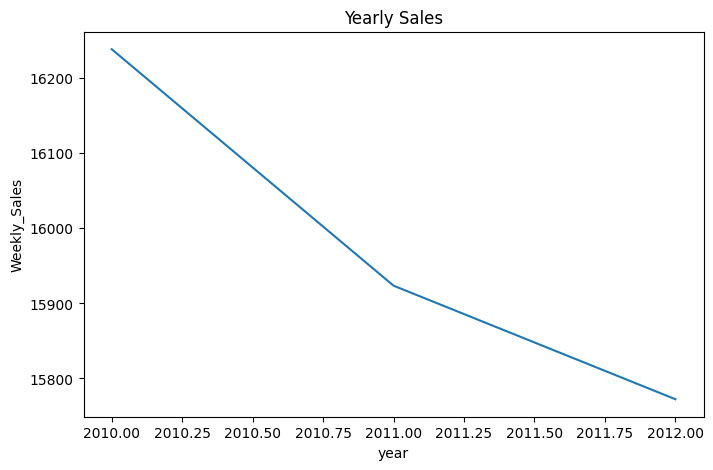

In [34]:
fig, ax = plt.subplots()
sns.lineplot(x=df_train['year'], y=df_train['Weekly_Sales'] , data=df_train, ax=ax, ci=None)
ax.set(title='Yearly Sales', ylabel=r'Weekly_Sales')
plt.savefig('Images/6.png');

<AxesSubplot:xlabel='month', ylabel='Weekly_Sales'>

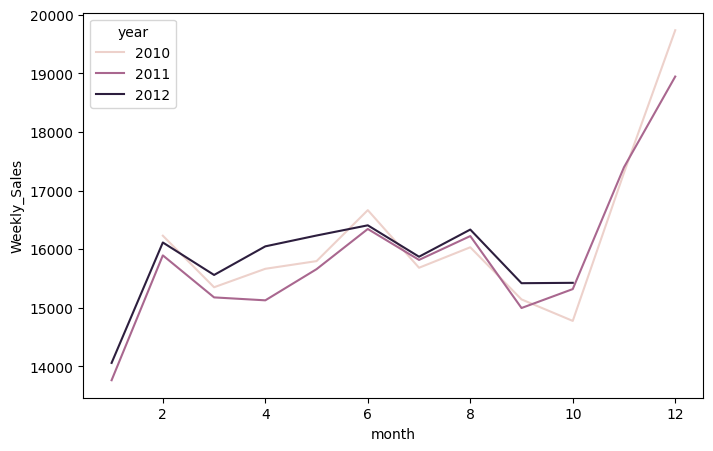

In [36]:
sns.lineplot(data=df_train, x="month", y="Weekly_Sales", hue="year", ci=None) #style="year", 

The above two graphs shows that the weeky sales are in its maximum during December and sales dropped in 2012 compared to 2010.

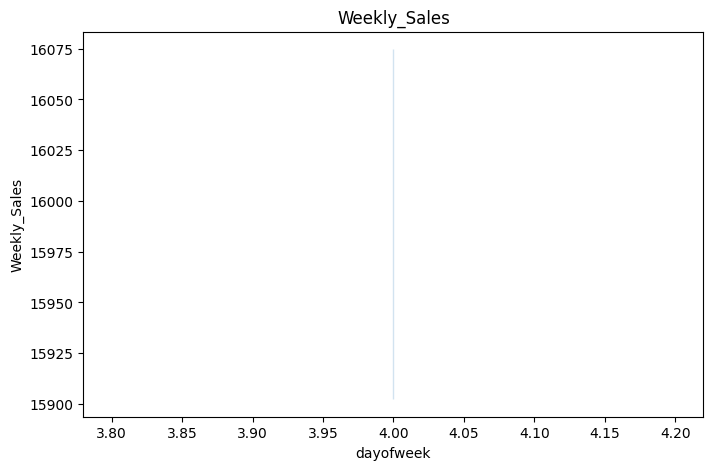

In [37]:
fig, ax = plt.subplots()
sns.lineplot(x=df_train['dayofweek'], y=df_train['Weekly_Sales'] , data=df_train, ax=ax)
ax.set(title='Weekly_Sales', ylabel=r'Weekly_Sales')
plt.savefig('Images/8.png');

In [38]:
df_train.columns

Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday', 'Temperature',
       'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4',
       'MarkDown5', 'CPI', 'Unemployment', 'Type', 'Size', 'timestamp', 'year',
       'month', 'day', 'dayofweek'],
      dtype='object')

<AxesSubplot:xlabel='Store', ylabel='Weekly_Sales'>

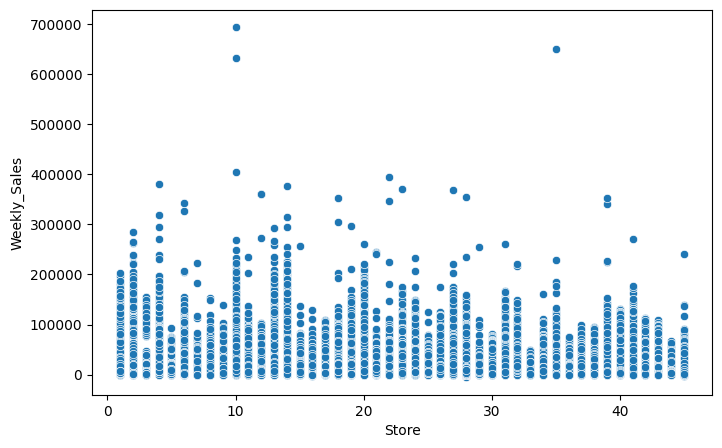

In [39]:
#Plotting weekly sales with Store
sns.scatterplot(x='Store', y='Weekly_Sales', data=df_train)

<AxesSubplot:>

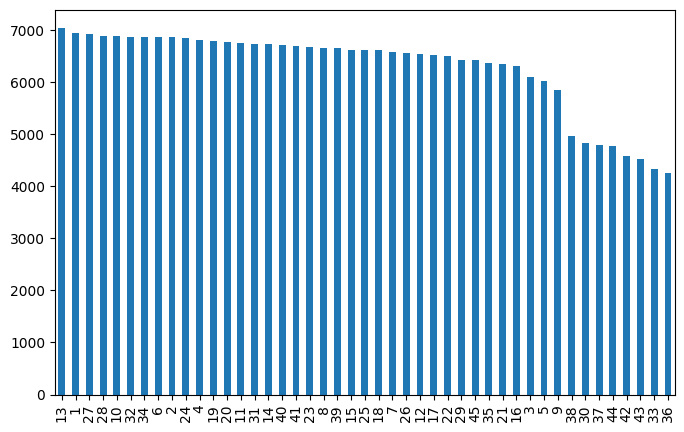

In [40]:
#plotting Store
df_train.Store.value_counts().plot.bar()

<AxesSubplot:xlabel='Dept', ylabel='Weekly_Sales'>

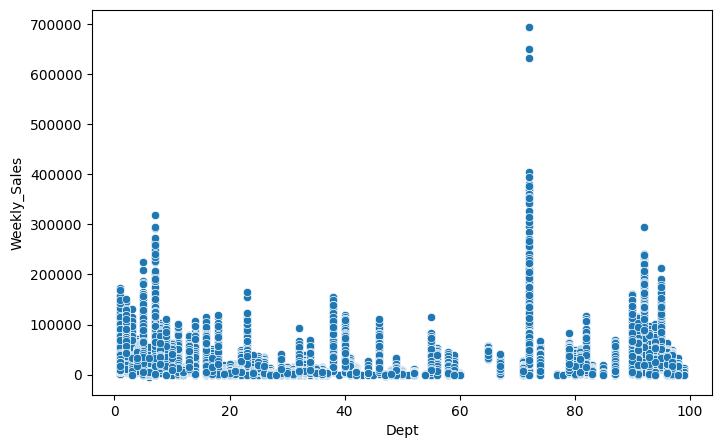

In [41]:
#Plotting weekly sales with Dept
sns.scatterplot(x='Dept', y='Weekly_Sales', data=df_train)

 Department 72 has higher weekly sales values.

<AxesSubplot:xlabel='IsHoliday', ylabel='Weekly_Sales'>

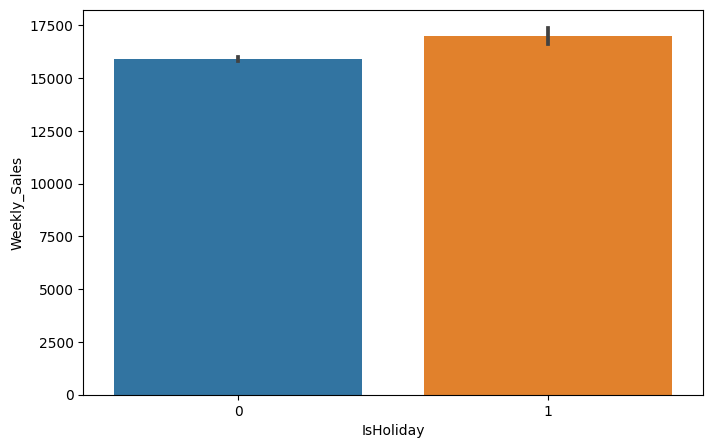

In [42]:
#Plotting weekly sales with holidays
sns.barplot(x='IsHoliday', y='Weekly_Sales', data=df_train)

Weekly sales are more during the holidays compared to other days.

<AxesSubplot:xlabel='Fuel_Price', ylabel='Weekly_Sales'>

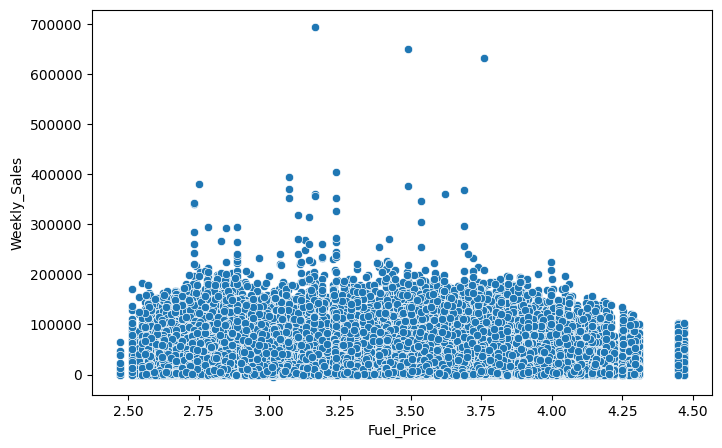

In [43]:
# Plotting weekly sales with Fuel_Price
sns.scatterplot(x='Fuel_Price', y='Weekly_Sales', data=df_train)

There is no relationship of weeky slaes as the fuel price increases.

In [44]:
# Weekly_Sales by Type

fig = px.pie(df_train,
             values='Weekly_Sales', 
             names='Type', 
             title='Weekly_Sales by Type', 
             
             width=700, height=400) #hole=.1,
fig.show()

Stores has 3 types as A, B and C according to their sizes. Almost half of the stores are bigger than 150000 and categorized as A. According to type, sales of the stores are changing.

<AxesSubplot:xlabel='Temperature', ylabel='Weekly_Sales'>

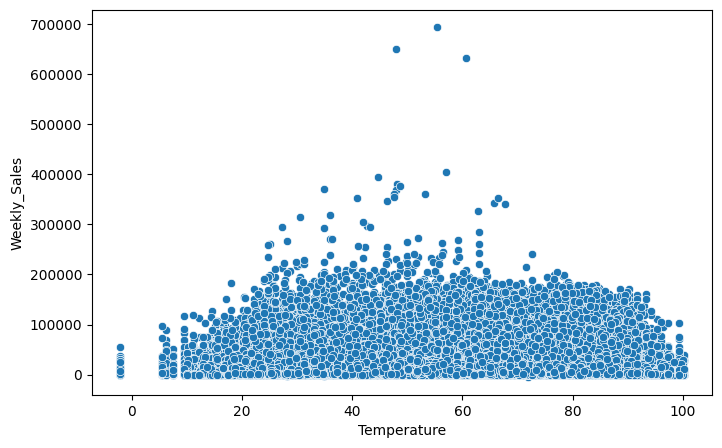

In [45]:
#Plotting weekly sales with Temperature
sns.scatterplot(x='Temperature', y='Weekly_Sales', data=df_train)

<AxesSubplot:xlabel='CPI', ylabel='Weekly_Sales'>

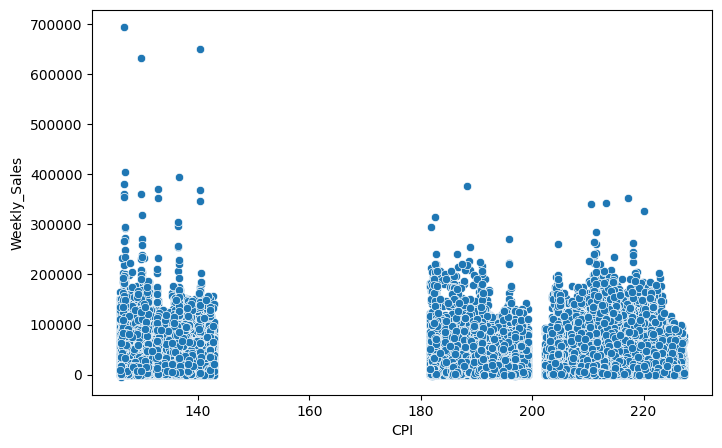

In [47]:
#Plotting weekly sales with CPI
sns.scatterplot(x='CPI', y='Weekly_Sales', data=df_train)

<AxesSubplot:xlabel='Size', ylabel='Weekly_Sales'>

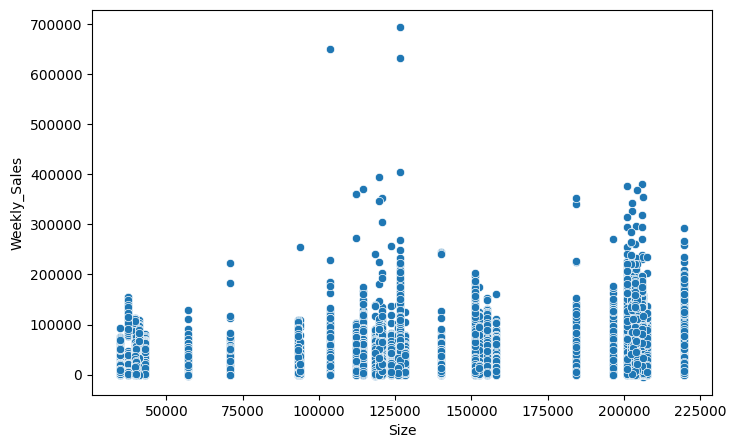

In [48]:
#Plotting weekly sales with Size
sns.scatterplot(x='Size', y='Weekly_Sales', data=df_train)

<AxesSubplot:xlabel='Unemployment', ylabel='Weekly_Sales'>

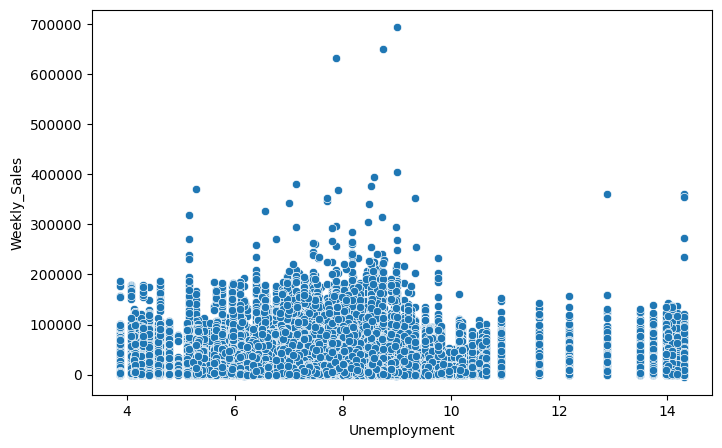

In [117]:
#Plotting weekly sales with Size
sns.scatterplot(x='Unemployment', y='Weekly_Sales', data=df_train)

### 5. Baseline Model

In [50]:
df_train_baseline = pd.read_csv("data/train.csv", sep = ",")

In [51]:
df_train_baseline.columns

Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday', 'Temperature',
       'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4',
       'MarkDown5', 'CPI', 'Unemployment', 'Type', 'Size'],
      dtype='object')

In [52]:
df_train_baseline.drop("Date", axis=1, inplace=True)

In [53]:
df_train_baseline.drop("Type", axis=1, inplace=True)

In [54]:
#Changing the variable "IsHoliday" from Boolean values to integer
df_train_baseline["IsHoliday"] = df_train["IsHoliday"].astype(int)

In [55]:
#Changing NaN values to zero
df_train_baseline.fillna(0, inplace=True)

In [56]:
y = df_train_baseline['Weekly_Sales']
X = df_train_baseline.drop('Weekly_Sales', axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

print('Original dataset  ---> ',X.shape,y.shape,'\nTraining set  ---> ', X_train.shape,y_train.shape,
'\nTesting set   ---> ', X_test.shape,'', y_test.shape)

Original dataset  --->  (282451, 13) (282451,) 
Training set  --->  (197715, 13) (197715,) 
Testing set   --->  (84736, 13)  (84736,)


In [57]:
reg = LinearRegression()
model_base = reg.fit(X_train,y_train)
y_pred=model_base.predict(X_test)

In [58]:
#intercept
reg.intercept_

6184.098834386643

In [59]:
# Coefficients
reg.coef_

array([-8.49338620e+01,  1.12690334e+02,  7.17859292e+02,  2.85029381e+01,
       -4.48036985e+02,  4.90424065e-03,  2.12715230e-03,  1.08401050e-01,
        2.24579064e-03,  7.60761510e-02, -2.38993389e+01, -1.75078502e+02,
        8.60091146e-02])

In [60]:
#Prediction
y_pred = reg.predict(X_test)

In [61]:
results_base = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
print(results_base)

          Actual  Predicted
5324    1,929.57   6,056.62
219142 47,753.37  13,790.31
34975   1,843.30  22,303.26
14894  19,055.36  14,057.04
252689 36,066.03  26,995.14
...          ...        ...
54923     176.14  19,587.73
111271 48,568.76  12,818.21
230845  8,382.65  14,601.47
114618    878.50  13,661.43
214420  4,075.96  11,586.01

[84736 rows x 2 columns]


In [62]:
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f'Mean absolute error: {mae:.4f}')
print(f'Mean squared error: {mse:.4f}')
print(f'Root mean squared error: {rmse:.4f}')

Mean absolute error: 14526.0699
Mean squared error: 461992960.7226
Root mean squared error: 21494.0215


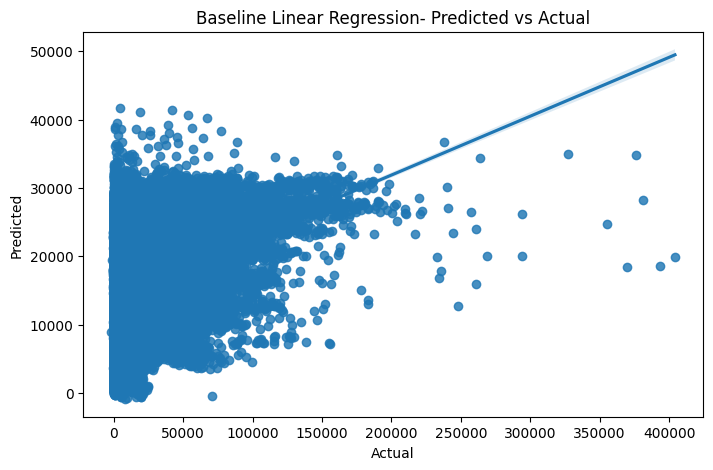

In [63]:
fig, ax = plt.subplots()
sns.scatterplot(x=results_base['Actual'], y=results_base['Predicted'] , data=results_base, alpha = 0.1)
ax = sns.regplot(x=results_base['Actual'], y=results_base['Predicted'] , data=results_base)
ax.set(title='Baseline Linear Regression- Predicted vs Actual');

In [64]:
# Plot with plotly
# # linear regression 

# tips = px.data.tips()

# fig = px.scatter(results_base, x="Actual", y="Predicted", trendline="ols")
# fig.show()

### 6. Feature Engineering

6.1. Removing outliers

In [65]:
# Selecting rows only the Weekly_Sales less than or equal to 250000
df2_train = df_train.loc[df_train['Weekly_Sales'] <= 250000]

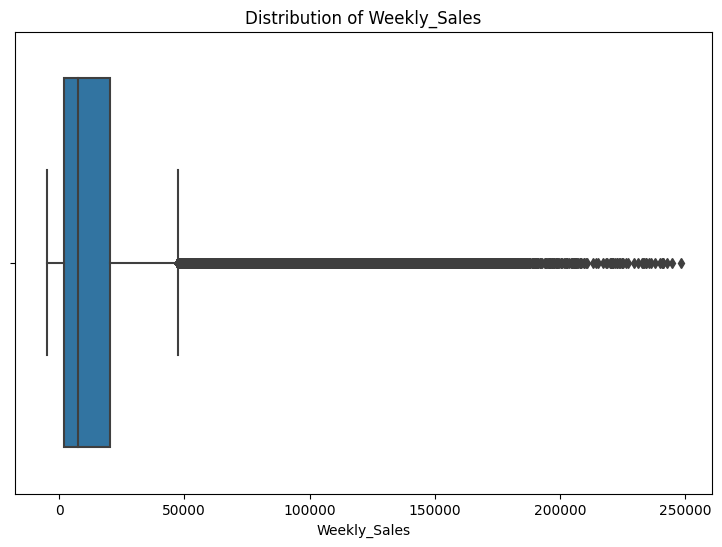

In [66]:
fig, ax = plt.subplots(figsize=(9, 6))
sns.boxplot(x='Weekly_Sales', data=df2_train, ax=ax)
ax.set(title='Distribution of Weekly_Sales', xlabel='Weekly_Sales');

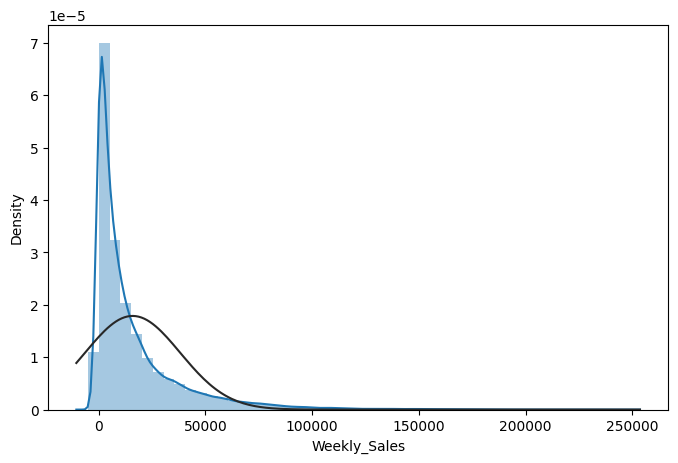

In [67]:
sns.distplot(df2_train['Weekly_Sales'], fit=norm);

In [68]:
df2_train.columns

Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday', 'Temperature',
       'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4',
       'MarkDown5', 'CPI', 'Unemployment', 'Type', 'Size', 'timestamp', 'year',
       'month', 'day', 'dayofweek'],
      dtype='object')

6.2. Handling categorical values

    Getting the dummy columns

In [69]:
#Changing categorical values
df2_train = pd.get_dummies(df2_train)

6.3. Feature Selection

In [70]:
#Dropping the date column
df2_train.drop("Date", axis=1, inplace=True)

In [71]:
df2_train.columns

Index(['Store', 'Dept', 'Weekly_Sales', 'IsHoliday', 'Temperature',
       'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4',
       'MarkDown5', 'CPI', 'Unemployment', 'Size', 'timestamp', 'year',
       'month', 'day', 'dayofweek', 'Type_A', 'Type_B', 'Type_C'],
      dtype='object')

In [72]:
df2_train.drop(['timestamp','CPI', 'dayofweek'], axis=1, inplace=True)

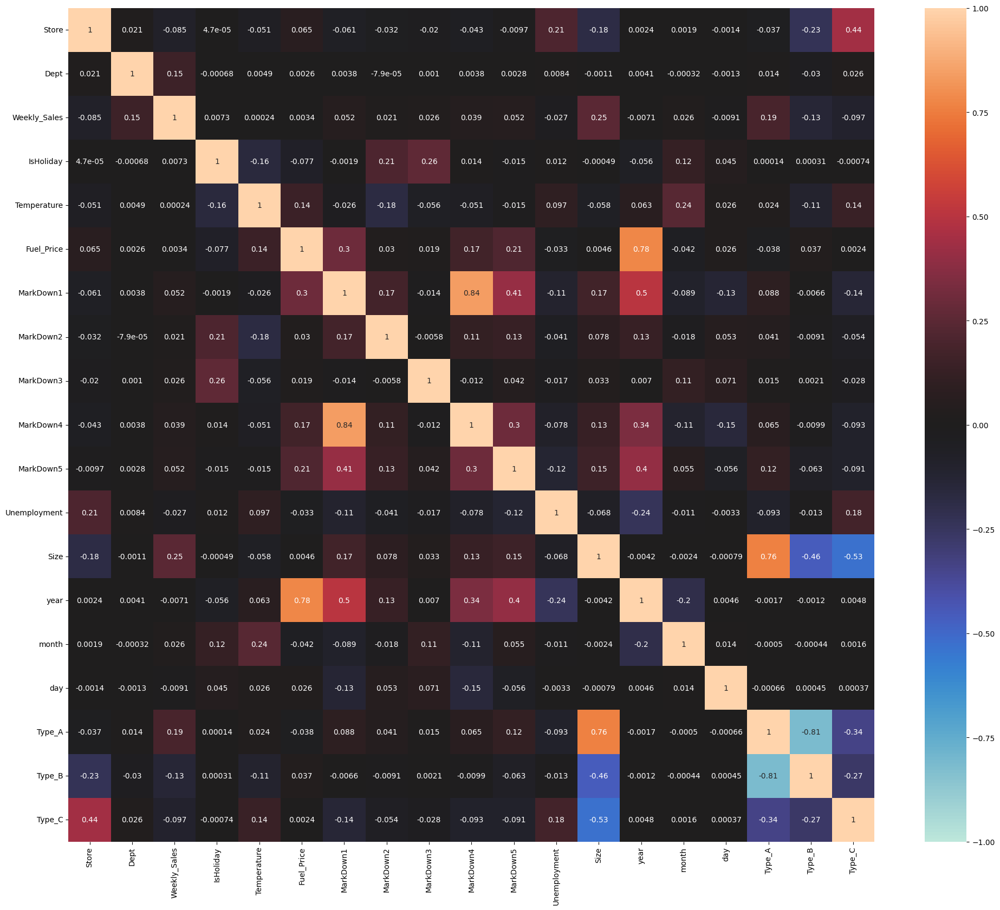

In [74]:
# Correlation heat map
plt.figure(figsize=[24,20])
sns.heatmap(df2_train.corr(), annot=True, vmin=-1, vmax=1, center=0) #cmap='BuGn'
plt.show()

#### 7. Modelling

In [75]:
#Splitting the data intro training & testing sets

y = df2_train['Weekly_Sales']
X = df2_train.drop('Weekly_Sales', axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

print('Original dataset  ---> ',X.shape,y.shape,'\nTraining set  ---> ', X_train.shape,y_train.shape,
'\nTesting set   ---> ', X_test.shape,'', y_test.shape)

Original dataset  --->  (282412, 18) (282412,) 
Training set  --->  (254170, 18) (254170,) 
Testing set   --->  (28242, 18)  (28242,)


#### 7.1 Linear Regression model 

In [76]:
# Instantiate our model 
lin_reg = LinearRegression()

# Train the model using our data
lin_reg.fit(X_train, y_train)

LinearRegression()

In [77]:
#intercept
lin_reg.intercept_

3279000.7029981217

In [78]:
# Coefficients
lin_reg.coef_

array([-1.26181720e+02,  1.09319057e+02,  6.47764479e+01, -1.49683675e+00,
        2.11302163e+03,  8.41139296e-02,  1.35017971e-02,  6.26532993e-02,
       -2.29377656e-02,  1.00801499e-01, -1.97217759e+02,  9.59894059e-02,
       -1.63262730e+03,  1.18030453e+02, -2.20888919e+01, -1.80111155e+03,
       -2.05484366e+03,  3.85595521e+03])

In [79]:
#Prediction
y_pred = lin_reg.predict(X_test)

In [80]:
# score returns the coefficient of determination (R^2) of the prediction
lin_reg.score(X_test,y_test)

0.09019338741427996

In [81]:
results_LR = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
print(results_LR)

          Actual  Predicted
87017   6,721.13   9,964.32
161688  4,197.64  13,046.31
95670  28,594.77  15,155.16
27611   5,184.95  16,549.76
74063   1,166.02  16,781.81
...          ...        ...
224175 46,991.06  12,889.16
166959  8,242.55  27,030.80
31736  99,633.26  26,451.50
219253 10,699.69   4,107.16
247855  1,625.50  11,221.29

[28242 rows x 2 columns]


In [82]:
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f'Mean absolute error: {mae:.4f}')
print(f'Mean squared error: {mse:.4f}')
print(f'Root mean squared error: {rmse:.4f}')

Mean absolute error: 14573.3035
Mean squared error: 455715826.5356
Root mean squared error: 21347.5016


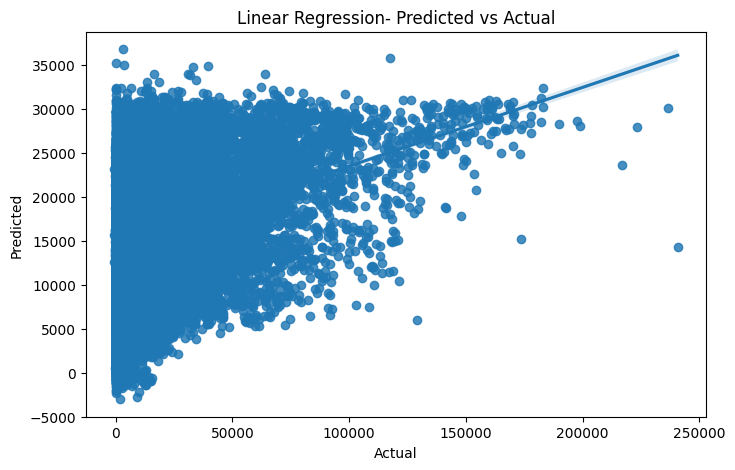

In [83]:
#Plotting Predicted vs Actual values
fig, ax = plt.subplots()
sns.scatterplot(x=results_LR['Actual'], y=results_LR['Predicted'] , data=results_LR, alpha = 0.1)
ax = sns.regplot(x=results_LR['Actual'], y=results_LR['Predicted'] , data=results_LR)
ax.set(title='Linear Regression- Predicted vs Actual');

#### 7.2 Random Forest (RF)

In [84]:
#Splitting the data intro training & testing sets

y = df2_train['Weekly_Sales']
X = df2_train.drop('Weekly_Sales', axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

print('Original dataset  ---> ',X.shape,y.shape,'\nTraining set  ---> ', X_train.shape,y_train.shape,
'\nTesting set   ---> ', X_test.shape,'', y_test.shape)

Original dataset  --->  (282412, 18) (282412,) 
Training set  --->  (254170, 18) (254170,) 
Testing set   --->  (28242, 18)  (28242,)


In [85]:
from sklearn.ensemble import RandomForestRegressor
regr = RandomForestRegressor(n_jobs = -1, random_state = 42, n_estimators = 500, verbose = 1)
regr.fit(X_train, y_train)
regr.score(X_train, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   52.4s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 11.1min finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    6.8s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:   31.0s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:   52.7s
[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:   56.5s finished


0.9967428930149415

In [86]:
#from sklearn import metrics
pred1 = regr.predict(X_test) 

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.9s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:    2.5s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:    4.7s
[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:    5.2s finished


In [87]:
mae = mean_absolute_error(y_test, pred1)
mse = mean_squared_error(y_test, pred1)
rmse = np.sqrt(mse)

print(f'Mean absolute error: {mae:.4f}')
print(f'Mean squared error: {mse:.4f}')
print(f'Root mean squared error: {rmse:.4f}')

Mean absolute error: 1446.5101
Mean squared error: 11997098.9907
Root mean squared error: 3463.6829


In [88]:
results_RF = pd.DataFrame({'Actual': y_test, 'Predicted': pred1})
print(results_RF)

          Actual  Predicted
87017   6,721.13   7,560.26
161688  4,197.64   3,746.69
95670  28,594.77  22,698.17
27611   5,184.95   5,016.48
74063   1,166.02   1,212.50
...          ...        ...
224175 46,991.06  43,100.22
166959  8,242.55   9,111.00
31736  99,633.26  91,298.67
219253 10,699.69   9,725.18
247855  1,625.50   1,305.66

[28242 rows x 2 columns]


In [89]:
results_RF.describe()

,Actual,Predicted
count,"28,242.00","28,242.00"
mean,"15,996.27","16,046.54"
std,"22,381.04","22,061.81"
min,-649.00,-230.92
25%,"2,090.28","2,212.41"
50%,"7,615.17","7,835.69"
75%,"20,264.44","20,426.79"
max,"240,758.86","206,552.77"


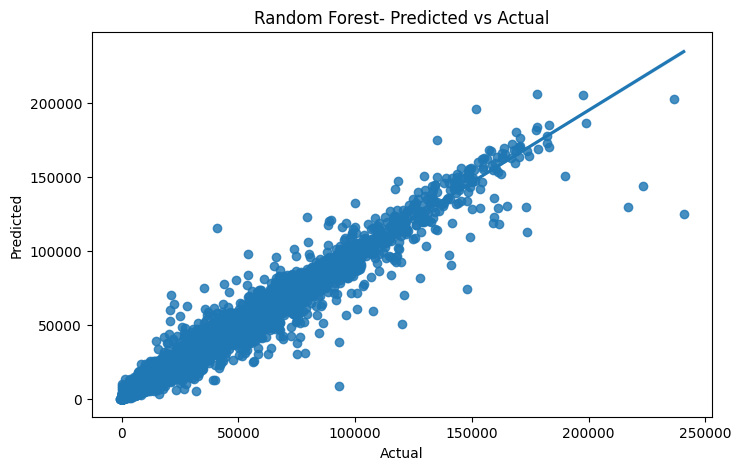

In [90]:
fig, ax = plt.subplots()
sns.scatterplot(x=results_RF['Actual'], y=results_RF['Predicted'] , data=results_RF, alpha = 0.1)
ax = sns.regplot(x=results_RF['Actual'], y=results_RF['Predicted'] , data=results_RF)
ax.set(title='Random Forest- Predicted vs Actual');

#### 7.3 Light Gradient Boosting Machine (LGBM)

In [91]:
import lightgbm as ltb

In [92]:
model = ltb.LGBMRegressor()
model.fit(X_train, y_train)
print(); print(model)


LGBMRegressor()


In [93]:
# Prediction
expected_y  = y_test
predicted_y = model.predict(X_test)

In [94]:
# Evaluation
mae = mean_absolute_error(y_test, predicted_y)
mse = mean_squared_error(y_test, predicted_y)
rmse = np.sqrt(mse)

print(f'Mean absolute error: {mae:.4f}')
print(f'Mean squared error: {mse:.4f}')
print(f'Root mean squared error: {rmse:.4f}')

Mean absolute error: 4108.5521
Mean squared error: 45648208.8260
Root mean squared error: 6756.3458


In [95]:
results_LGBM = pd.DataFrame({'Actual': y_test, 'Predicted': predicted_y})
print(results_LGBM)

          Actual  Predicted
87017   6,721.13   6,971.73
161688  4,197.64   2,328.26
95670  28,594.77  24,158.04
27611   5,184.95   8,236.60
74063   1,166.02     426.05
...          ...        ...
224175 46,991.06  37,601.15
166959  8,242.55   8,782.84
31736  99,633.26  81,813.97
219253 10,699.69  12,350.90
247855  1,625.50     786.46

[28242 rows x 2 columns]


In [96]:
results_LGBM.describe()

,Actual,Predicted
count,"28,242.00","28,242.00"
mean,"15,996.27","15,979.92"
std,"22,381.04","19,944.23"
min,-649.00,"-4,396.59"
25%,"2,090.28","4,003.67"
50%,"7,615.17","8,413.39"
75%,"20,264.44","19,967.73"
max,"240,758.86","169,397.37"


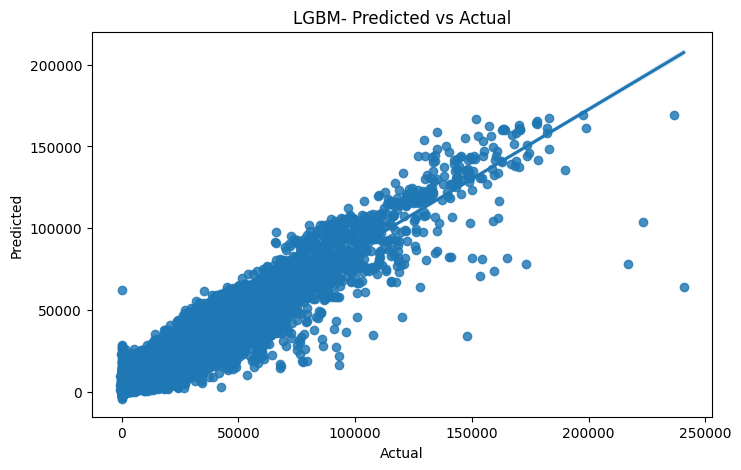

In [97]:
fig, ax = plt.subplots()
sns.scatterplot(x=results_LGBM['Actual'], y=results_LGBM['Predicted'] , data=results_LGBM, alpha = 0.1)
ax = sns.regplot(x=results_LGBM['Actual'], y=results_LGBM['Predicted'] , data=results_LGBM)
ax.set(title='LGBM- Predicted vs Actual');

#### 8. Model Evaluation and Selection

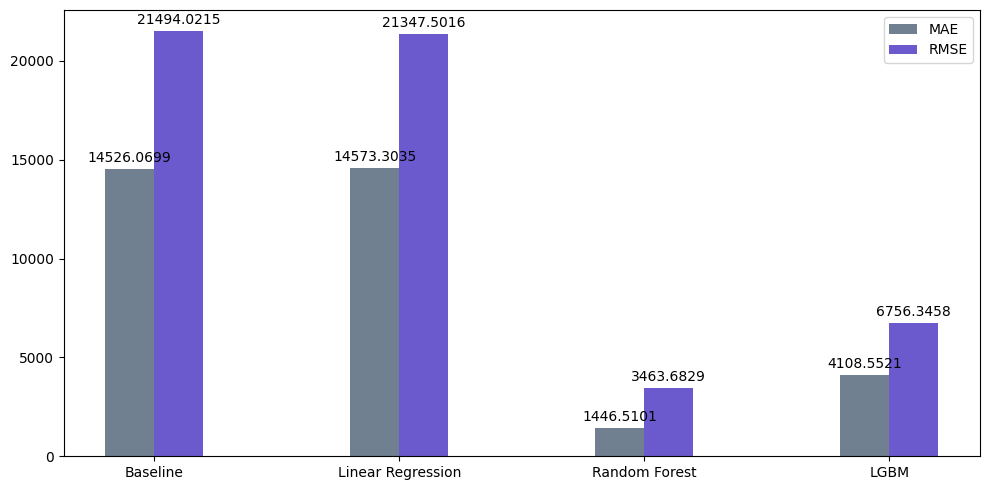

In [98]:
labels = ['Baseline', 'Linear Regression', 'Random Forest', 'LGBM']
RMSE = [21494.0215, 21347.5016, 3463.6829, 6756.3458]
MAE = [14526.0699, 14573.3035, 1446.5101, 4108.5521]
#MSE = [461992960.7226, 455715826.5356, 11997098.9907, 45648208.8260]


x = np.arange(len(labels))  # the label locations
width = 0.2  # the width of the bars

fig, ax = plt.subplots(figsize=(10, 5))

rects1 = ax.bar(x - width/2, MAE, width, label='MAE', color='slategrey')
rects2 = ax.bar(x + width/2, RMSE, width, label='RMSE', color='slateblue')
#rects3 = ax.bar(x + width/2 + width, MSE, width, label='MSE', color='cornflowerblue')


# Add some text for labels, title and custom x-axis tick labels, etc.
#ax.set_ylabel('RMSE')
#ax.set_title('Model Performance')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()


def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)
#autolabel(rects3)

fig.tight_layout()

plt.show()
#fig.savefig('images/Model_Evaluation.png', dpi=300)

#### 9. Sales prediction on test data 

In [99]:
df_test = pd.read_csv("data/test.csv", sep = ",")

In [100]:
df_test.head(2)

,Store,Dept,Date,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Type,Size
0,28,40,2012-01-06,False,50.43,3.60,"5,155.86","19,549.51",218.29,636.73,"5,218.50",130.16,12.19,A,206302
1,18,93,2012-03-09,False,38.10,3.88,"7,410.18",368.19,25.46,"1,852.39","2,332.07",137.51,8.07,B,120653


In [101]:
#Checking for how many rows and columns
df_test.shape

(139119, 15)

In [102]:
#Checking for null values in each column
df_test.isnull().sum()

Store                0
Dept                 0
Date                 0
IsHoliday            0
Temperature          0
Fuel_Price           0
MarkDown1        88958
MarkDown2       102103
MarkDown3        93549
MarkDown4        94183
MarkDown5        88716
CPI                  0
Unemployment         0
Type                 0
Size                 0
dtype: int64

In [103]:
# Checking for type of data present in the dataframe
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 139119 entries, 0 to 139118
Data columns (total 15 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Store         139119 non-null  int64  
 1   Dept          139119 non-null  int64  
 2   Date          139119 non-null  object 
 3   IsHoliday     139119 non-null  bool   
 4   Temperature   139119 non-null  float64
 5   Fuel_Price    139119 non-null  float64
 6   MarkDown1     50161 non-null   float64
 7   MarkDown2     37016 non-null   float64
 8   MarkDown3     45570 non-null   float64
 9   MarkDown4     44936 non-null   float64
 10  MarkDown5     50403 non-null   float64
 11  CPI           139119 non-null  float64
 12  Unemployment  139119 non-null  float64
 13  Type          139119 non-null  object 
 14  Size          139119 non-null  int64  
dtypes: bool(1), float64(9), int64(3), object(2)
memory usage: 15.0+ MB


In [104]:
# Checking for unique values
df_test.nunique()

Store             45
Dept              81
Date             143
IsHoliday          2
Temperature     3528
Fuel_Price       892
MarkDown1       2277
MarkDown2       1499
MarkDown3       1662
MarkDown4       1944
MarkDown5       2293
CPI             2145
Unemployment     349
Type               3
Size              40
dtype: int64

In [105]:
# Finding the descriptive statistics
df_test.describe()

,Store,Dept,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Size
count,"139,119.00","139,119.00","139,119.00","139,119.00","50,161.00","37,016.00","45,570.00","44,936.00","50,403.00","139,119.00","139,119.00","139,119.00"
mean,22.22,44.21,60.04,3.36,"7,247.11","3,367.16","1,483.65","3,390.33","4,607.93",171.19,7.94,"136,723.54"
std,12.79,30.47,18.45,0.46,"8,364.20","9,454.88","9,772.35","6,338.19","5,762.34",39.16,1.85,"60,936.65"
min,1.00,1.00,-2.06,2.47,0.27,-265.76,-29.10,0.22,135.16,126.06,3.88,"34,875.00"
25%,11.00,18.00,46.63,2.94,"2,229.52",42.16,5.20,500.91,"1,880.31",132.02,6.89,"93,638.00"
50%,22.00,37.00,62.01,3.46,"5,307.81",193.90,24.94,"1,479.91","3,332.99",182.32,7.87,"140,167.00"
75%,33.00,72.00,74.25,3.74,"9,160.25","1,958.52",105.09,"3,578.40","5,556.15",212.40,8.57,"202,505.00"
max,45.00,99.00,100.14,4.47,"88,646.76","104,519.54","141,630.61","67,474.85","108,519.28",227.23,14.31,"219,622.00"


#### 9.1 Preprocessing and Cleaning

In [106]:
#Changing Time to datetime stamp
df_test['Date'] = pd.to_datetime(df_test['Date'], format='%Y-%m-%d')

In [107]:
# Extracting Year, month, day and day of year from the shipping date column
df_test = df_test.assign(
    timestamp = lambda x: pd.to_datetime(x['Date']), 
    year = lambda x: x['timestamp'].dt.year,
    month = lambda x: x['timestamp'].dt.month,
    day = lambda x: x['timestamp'].dt.day,
    dayofweek = lambda x: x['Date'].dt.dayofweek
)

In [108]:
#Changing the variable "IsHoliday" from Boolean values to integer
df_train["IsHoliday"] = df_train["IsHoliday"].astype(int)

In [109]:
#Changing NaN values to zero
df_test.fillna(0, inplace=True)

In [110]:
#Changing categorical values
df_test = pd.get_dummies(df_test)

In [111]:
df_test.columns

Index(['Store', 'Dept', 'Date', 'IsHoliday', 'Temperature', 'Fuel_Price',
       'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI',
       'Unemployment', 'Size', 'timestamp', 'year', 'month', 'day',
       'dayofweek', 'Type_A', 'Type_B', 'Type_C'],
      dtype='object')

In [112]:
#Dropping Columns
df_test.drop(['timestamp','CPI', 'dayofweek', 'Date'], axis=1, inplace=True)

#### 9.2. The prediction of the test data using Random Forest

In [113]:
from sklearn.ensemble import RandomForestRegressor
regr = RandomForestRegressor(n_jobs = -1, random_state = 42, n_estimators = 500, verbose = 1)
regr.fit(X_train, y_train)
regr.score(X_train, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   52.2s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 11.0min finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    5.5s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:   22.6s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:   57.8s
[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:  1.1min finished


0.9967428930149415

In [114]:
#from sklearn import metrics
pred1 = regr.predict(df_test) 

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:   11.8s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:   26.1s
[Parallel(n_jobs=4)]: Done 500 out of 500 | elapsed:   28.2s finished


In [115]:
results_test_RF = pd.DataFrame({'Predicted': pred1})
print(results_test_RF)

        Predicted
0       51,073.42
1        4,054.83
2       10,485.57
3        3,793.81
4        5,243.72
...           ...
139114   9,578.41
139115   3,746.96
139116  31,262.34
139117   5,529.17
139118   7,954.51

[139119 rows x 1 columns]


In [116]:
results_test_RF.to_csv("data/Predicted_test_results_RF.csv")

11. Outlook

The modelling can be further continued using algorithms like
Random Forest with gridsearch CV, Polynomial regression, Lasso regression, KNeighborsRegressor, time series models, neural networks etc